In [1]:
import os
import shutil
from google.colab import drive

# 1. Mount Google Drive
print("Mounting Google Drive...")
drive.mount('/content/drive')

Mounting Google Drive...
Mounted at /content/drive


In [2]:
# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 0 · KAGGLE DATASET SETUP (kagglehub)            ║
# ╚══════════════════════════════════════════════════════════╝
import kagglehub
import os

print("Downloading Kaggle Dataset...")
dataset_path = kagglehub.dataset_download("paultimothymooney/chest-xray-pneumonia")
print(f"Dataset cached at: {dataset_path}")

_ROOT = os.path.join(dataset_path, "chest_xray")
if not os.path.exists(os.path.join(_ROOT, "train", "NORMAL")):
    _ROOT = os.path.join(dataset_path, "chest_xray", "chest_xray")

print(f"Verified Root Path: {_ROOT}")


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 1 · IMPORTS & ENVIRONMENT                       ║
# ╚══════════════════════════════════════════════════════════╝
import warnings, json, pickle, shutil, gc
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import cv2
from PIL import Image
from tqdm import tqdm
from datetime import datetime

import tensorflow as tf

# ── Allow GPU memory to grow (must be set BEFORE mixed precision) ──
gpus = tf.config.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# ── Mixed precision: ~40% less GPU RAM, faster on T4 ──────────────
#tf.keras.mixed_precision.set_global_policy('float32')

from tensorflow.keras import layers, Model, backend as K
from tensorflow.keras.applications import (
    InceptionV3, ResNet50, VGG16,
    EfficientNetB0, DenseNet121, MobileNetV2
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, CSVLogger
)
from tensorflow.keras.utils import to_categorical

from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, precision_score, recall_score,
    f1_score, roc_curve, auc
)

print(f"TensorFlow   : {tf.__version__}")
print(f"Keras        : {tf.keras.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")
print(f"Mixed Prec.  : {tf.keras.mixed_precision.global_policy().name}")
print(f"Session Start: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 2 · GLOBAL CONFIGURATION                        ║
# ╚══════════════════════════════════════════════════════════╝
_OUT     = "/content/pneumonia_output"
_MODELS  = os.path.join(_OUT, "models")
_BEST    = os.path.join(_OUT, "best")
_HIST    = os.path.join(_OUT, "histories")
_METRICS = os.path.join(_OUT, "metrics")
_PLOTS   = os.path.join(_OUT, "plots")

for _d in [_MODELS, _BEST, _HIST, _METRICS, _PLOTS]:
    os.makedirs(_d, exist_ok=True)

CFG = {
    "IMG_SIZE"    : 224,
    "BATCH_SIZE"  : 16,          # halved vs original to cut GPU peak
    "EPOCHS"      : 30,
    "LR"          : 1e-4,
    "NUM_CLASSES" : 2,
    "SEED"        : 42,
    "CLASS_NAMES" : ["NORMAL", "PNEUMONIA"],

    "SAVE_DIR"    : _MODELS,
    "BEST_DIR"    : _BEST,
    "HIST_DIR"    : _HIST,
    "METRICS_DIR" : _METRICS,
    "PLOTS_DIR"   : _PLOTS,
    "OUT_ROOT"    : _OUT,

    "TRAIN_DIR"   : os.path.join(_ROOT, "train"),
    "VAL_DIR"     : os.path.join(_ROOT, "val"),
    "TEST_DIR"    : os.path.join(_ROOT, "test"),

    "PATHS": {
        "val_normal"    : os.path.join(_ROOT, "val",  "NORMAL"),
        "val_pneumonia" : os.path.join(_ROOT, "val",  "PNEUMONIA"),
        "test_normal"   : os.path.join(_ROOT, "test", "NORMAL"),
        "test_pneumonia": os.path.join(_ROOT, "test", "PNEUMONIA"),
    },
}

tf.random.set_seed(CFG["SEED"])
np.random.seed(CFG["SEED"])

print(f"\nAll outputs → {_OUT}")


# ╔══════════════════════════════════════════════════════════╗
# ║  MEMORY UTILITIES                                        ║
# ╚══════════════════════════════════════════════════════════╝
def free_memory(label: str = ""):
    gc.collect()
    K.clear_session()
    if gpus:
        try:
            mem      = tf.config.experimental.get_memory_info('GPU:0')
            used_gb  = mem['current'] / 1024**3
            print(f"  🧹 [{label}] GPU mem in use: {used_gb:.2f} GB")
        except Exception:
            pass

def ram_mb() -> float:
    try:
        import psutil
        return psutil.Process(os.getpid()).memory_info().rss / 1024**2
    except ImportError:
        return -1.0


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 3 · DATA LOADING                                ║
# ╚══════════════════════════════════════════════════════════╝

def _build_tf_dataset(directory: str, cfg: dict, shuffle: bool = False, validation_split: float = None, subset: str = None) -> tf.data.Dataset:
    """
    Build a tf.data.Dataset.
    NOTE: Augmentation removed from here to fix Keras 3 dtype bug.
    """
    ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        labels      = "inferred",
        label_mode  = "categorical",          # one-hot float32
        class_names = cfg["CLASS_NAMES"],     # NORMAL=0, PNEUMONIA=1
        image_size  = (cfg["IMG_SIZE"], cfg["IMG_SIZE"]),
        batch_size  = cfg["BATCH_SIZE"],
        shuffle     = shuffle,
        seed        = cfg["SEED"],
        validation_split = validation_split,
        subset      = subset,
    )

    # Keep in raw [0, 255] range for native preprocess_input layers
    ds = ds.map(
        lambda x, y: (tf.cast(x, tf.float32), y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    return ds.prefetch(tf.data.AUTOTUNE)


def _count_samples(directory: str, class_names: list) -> dict:
    counts = {}
    for cn in class_names:
        folder = os.path.join(directory, cn)
        counts[cn] = len([
            f for f in os.listdir(folder)
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]) if os.path.isdir(folder) else 0
    return counts


def _load_folder_to_numpy(folder: str, label: int, img_size: int = 224) -> tuple:
    """Load one class folder into numpy arrays (val / test only)."""
    images, labels = [], []
    files = sorted([
        f for f in os.listdir(folder)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])
    tag = f"{'NORMAL' if label == 0 else 'PNEUMONIA'} [{os.path.basename(folder)}]"
    for fname in tqdm(files, desc=tag, leave=False):
        path = os.path.join(folder, fname)
        try:
            img = Image.open(path).convert('RGB')
            img = img.resize((img_size, img_size), Image.LANCZOS)
            images.append(np.array(img, dtype=np.float32))
            labels.append(label)
        except Exception as e:
            print(f"  ⚠  Skipped {fname}: {e}")
    return (np.array(images, dtype=np.float32),
            np.array(labels, dtype=np.int32))


def _load_split_numpy(normal_path: str, pneu_path: str, img_size: int = 224) -> tuple:
    xn, yn = _load_folder_to_numpy(normal_path, 0, img_size)
    xp, yp = _load_folder_to_numpy(pneu_path,   1, img_size)
    return np.concatenate([xn, xp]), np.concatenate([yn, yp])


def compute_class_weights(train_dir: str, class_names: list) -> dict:
    counts = _count_samples(train_dir, class_names)
    total  = sum(counts.values())
    n_cls  = len(class_names)
    cw     = {i: total / (n_cls * counts[c]) for i, c in enumerate(class_names)}
    print(f"\n  Class weights: {cw}")
    return cw


def explore_dataset(y_val, y_test, cfg: dict) -> pd.DataFrame:
    print("\n── Class Distribution ─────────────────────────────────")
    train_counts = _count_samples(cfg["TRAIN_DIR"], cfg["CLASS_NAMES"])
    splits = {
        "Train": train_counts,
        "Val"  : {cfg["CLASS_NAMES"][i]: int((y_val  == i).sum()) for i in range(cfg["NUM_CLASSES"])},
        "Test" : {cfg["CLASS_NAMES"][i]: int((y_test == i).sum()) for i in range(cfg["NUM_CLASSES"])},
    }

    rows = []
    for sname, cnt in splits.items():
        for cname, n in cnt.items():
            rows.append({"Split": sname, "Class": cname, "Count": n})
    dist_df = pd.DataFrame(rows)
    print(dist_df.pivot(index="Class", columns="Split", values="Count").to_string())

    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    colors = ["#4CAF50", "#F44336"]
    for ax, (sname, cnt) in zip(axes, splits.items()):
        cnts = [cnt[c] for c in cfg["CLASS_NAMES"]]
        bars = ax.bar(cfg["CLASS_NAMES"], cnts, color=colors, edgecolor='k')
        for bar, val in zip(bars, cnts):
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + max(cnts) * 0.01,
                    str(val), ha='center', fontsize=11, fontweight='bold')
        ax.set_title(f"{sname} Split", fontsize=13)
        ax.set_ylabel("Count"); ax.grid(axis='y', alpha=0.3)

    plt.suptitle("Class Imbalance Analysis", fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(cfg["PLOTS_DIR"], "class_distribution.png"), dpi=150, bbox_inches='tight')
    plt.show()
    return dist_df


def show_sample_images_from_dir(cfg: dict, n: int = 16, title: str = "Sample X-Rays"):
    all_paths, all_labels = [], []
    for ci, cname in enumerate(cfg["CLASS_NAMES"]):
        folder = os.path.join(cfg["TRAIN_DIR"], cname)
        files  = [os.path.join(folder, f) for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        sample = np.random.choice(files, min(n // 2, len(files)), replace=False)
        all_paths.extend(sample); all_labels.extend([ci] * len(sample))

    fig, axes = plt.subplots(4, 4, figsize=(14, 14))
    for ax, path, lbl in zip(axes.flat, all_paths, all_labels):
        img = Image.open(path).convert('RGB').resize((cfg["IMG_SIZE"], cfg["IMG_SIZE"]), Image.LANCZOS)
        ax.imshow(np.array(img))
        ax.set_title(cfg["CLASS_NAMES"][lbl], fontsize=10, color='green' if lbl == 0 else 'red')
        ax.axis('off')
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(cfg["PLOTS_DIR"], "sample_xrays.png"), dpi=150, bbox_inches='tight')
    plt.show()


def prepare_data(cfg: dict) -> tuple:
    print("\n── Building TRAIN tf.data pipeline with 15% validation split ──")
    # Split a representative validation set from the training set itself!
    train_ds = _build_tf_dataset(cfg["TRAIN_DIR"], cfg, shuffle=True, validation_split=0.15, subset="training")

    # Load validation split of dataset
    val_ds = _build_tf_dataset(cfg["TRAIN_DIR"], cfg, shuffle=True, validation_split=0.15, subset="validation")

    # Extract validation split into numpy arrays for fast evaluation and callbacks
    print("  Extracting validation set into RAM...")
    val_images, val_labels = [], []
    for x, y in val_ds:
        val_images.append(x.numpy())
        val_labels.append(y.numpy())
    x_val = np.concatenate(val_images, axis=0)
    y_val_oh = np.concatenate(val_labels, axis=0)
    y_val = np.argmax(y_val_oh, axis=1)

    n_train = len(train_ds) * cfg["BATCH_SIZE"]
    train_steps = n_train // cfg["BATCH_SIZE"]
    print(f"  Train samples : {n_train}  |  steps/epoch : {train_steps}")
    print(f"  Val  : {x_val.shape}  ({x_val.nbytes/1024**2:.1f} MB)")

    print("\n── Loading TEST split into RAM ─────────────────────────")
    x_test, y_test = _load_split_numpy(cfg["PATHS"]["test_normal"], cfg["PATHS"]["test_pneumonia"], cfg["IMG_SIZE"])
    print(f"  Test : {x_test.shape}  ({x_test.nbytes/1024**2:.1f} MB)")

    y_test_oh = to_categorical(y_test, num_classes=cfg["NUM_CLASSES"])
    class_weights = compute_class_weights(cfg["TRAIN_DIR"], cfg["CLASS_NAMES"])

    explore_dataset(y_val, y_test, cfg)
    show_sample_images_from_dir(cfg, title="Training — Sample Chest X-Rays")

    print(f"\n  RAM after data prep: {ram_mb():.0f} MB")
    return (train_ds, train_steps, x_val,  y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights)


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 5 · MODEL ARCHITECTURE DEFINITIONS            ║
# ╚══════════════════════════════════════════════════════════╝

def get_aug_layers() -> tf.keras.Sequential:
    """
    CRITICAL FIX: Augmentation is now natively integrated into the models.
    This runs on the GPU and entirely bypasses the Keras 3 tf.data map bug.
    """
    return tf.keras.Sequential([
        layers.RandomRotation(factor=0.042),
        layers.RandomTranslation(0.10, 0.10),
        layers.RandomZoom(0.10),
        layers.RandomFlip("horizontal"),
    ], name="data_augmentation")


def _build_head(base_output, num_classes: int, dropout_rate: float = 0.4):
    x = layers.GlobalAveragePooling2D()(base_output)
    x = layers.LayerNormalization()(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = layers.Dropout(dropout_rate / 2)(x)
    return layers.Dense(num_classes, activation='softmax', dtype='float32')(x)


def build_inceptionv3(cfg: dict) -> Model:
    from tensorflow.keras.applications.inception_v3 import preprocess_input
    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3))
    x = get_aug_layers()(inputs)
    x = layers.Lambda(preprocess_input, name="inception_preprocessing")(x)
    base = InceptionV3(input_tensor=x, include_top=False, weights='imagenet')
    for layer in base.layers[:-40]: layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False

    model = Model(inputs, _build_head(base.output, cfg["NUM_CLASSES"]), name="InceptionV3")
    model.compile(Adam(learning_rate=cfg["LR"]), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


def build_resnet50(cfg: dict) -> Model:
    from tensorflow.keras.applications.resnet50 import preprocess_input
    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3))
    x = get_aug_layers()(inputs)
    x = layers.Lambda(preprocess_input, name="resnet_preprocessing")(x)
    base = ResNet50(input_tensor=x, include_top=False, weights='imagenet')
    for layer in base.layers[:-40]: layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False

    model = Model(inputs, _build_head(base.output, cfg["NUM_CLASSES"]), name="ResNet50")
    model.compile(Adam(learning_rate=cfg["LR"]), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


def build_vgg16(cfg: dict) -> Model:
    from tensorflow.keras.applications.vgg16 import preprocess_input
    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3))
    x = get_aug_layers()(inputs)
    x = layers.Lambda(preprocess_input, name="vgg_preprocessing")(x)
    base = VGG16(input_tensor=x, include_top=False, weights='imagenet')
    for layer in base.layers[:-8]: layer.trainable = False

    model = Model(inputs, _build_head(base.output, cfg["NUM_CLASSES"], 0.5), name="VGG16")
    model.compile(Adam(learning_rate=cfg["LR"]), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


def build_efficientnetb0(cfg: dict) -> Model:
    # Force float32 input type for EfficientNet
    # (Avoid global policy side-effects)

    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3),dtype=tf.float32)
    x = get_aug_layers()(inputs)
    base = EfficientNetB0(input_tensor=x,include_top=False, weights='imagenet')

    for layer in base.layers[:-40]:
        layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

    model = Model(
        inputs,
        _build_head(base.output, cfg["NUM_CLASSES"]),
        name="EfficientNetB0"
    )

    model.compile(
        optimizer=Adam(learning_rate=cfg["LR"] / 2),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


def build_densenet121(cfg: dict) -> Model:
    from tensorflow.keras.applications.densenet import preprocess_input
    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3))
    x = get_aug_layers()(inputs)
    x = layers.Lambda(preprocess_input, name="densenet_preprocessing")(x)
    base = DenseNet121(input_tensor=x, include_top=False, weights='imagenet')
    for layer in base.layers[:-40]: layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False
    for layer in base.layers[-40:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False

    model = Model(inputs, _build_head(base.output, cfg["NUM_CLASSES"]), name="DenseNet121")
    model.compile(Adam(learning_rate=cfg["LR"]), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


def build_mobilenetv2(cfg: dict) -> Model:
    from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
    inputs = layers.Input(shape=(cfg["IMG_SIZE"], cfg["IMG_SIZE"], 3))
    x = get_aug_layers()(inputs)
    x = layers.Lambda(preprocess_input, name="mobilenet_preprocessing")(x)
    base = MobileNetV2(input_tensor=x, include_top=False, weights='imagenet')
    for layer in base.layers[:-30]: layer.trainable = False
    for layer in base.layers[-30:]:
        if isinstance(layer, layers.BatchNormalization): layer.trainable = False

    model = Model(inputs, _build_head(base.output, cfg["NUM_CLASSES"]), name="MobileNetV2")
    model.compile(Adam(learning_rate=cfg["LR"]), loss='categorical_crossentropy', metrics=['accuracy'])
    return model


MODEL_REGISTRY = {
    "InceptionV3"   : build_inceptionv3,
    "ResNet50"      : build_resnet50,
    "VGG16"         : build_vgg16,
    "EfficientNetB0": build_efficientnetb0,
    "DenseNet121"   : build_densenet121,
    "MobileNetV2"   : build_mobilenetv2,
}


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 6 · MODEL SAVING UTILITIES                      ║
# ╚══════════════════════════════════════════════════════════╝

def save_model_keras(model: Model, model_name: str, save_dir: str) -> str:
    path = os.path.join(save_dir, f"{model_name}.keras")
    model.save(path)
    size_mb = os.path.getsize(path) / (1024**2)
    print(f"  💾 .keras saved  → {path}  ({size_mb:.1f} MB)")
    return path

def save_model_weights_pkl(model: Model, model_name: str, save_dir: str) -> str:
    path = os.path.join(save_dir, f"{model_name}_weights.pkl")
    with open(path, 'wb') as f:
        pickle.dump(model.get_weights(), f, protocol=pickle.HIGHEST_PROTOCOL)
    size_mb = os.path.getsize(path) / (1024**2)
    print(f"  💾 .pkl  saved   → {path}  ({size_mb:.1f} MB)")
    return path

def save_history_pkl(history, model_name: str, hist_dir: str) -> str:
    path = os.path.join(hist_dir, f"{model_name}_history.pkl")
    with open(path, 'wb') as f:
        pickle.dump(history.history, f, protocol=pickle.HIGHEST_PROTOCOL)
    print(f"  📈 history .pkl  → {path}")
    return path

def load_model_keras(model_name: str, save_dir: str) -> Model:
    path  = os.path.join(save_dir, f"{model_name}.keras")
    custom_objects = {}
    if "InceptionV3" in model_name:
        from tensorflow.keras.applications.inception_v3 import preprocess_input
        custom_objects = {"preprocess_input": preprocess_input}
    elif "ResNet50" in model_name:
        from tensorflow.keras.applications.resnet50 import preprocess_input
        custom_objects = {"preprocess_input": preprocess_input}
    elif "VGG16" in model_name:
        from tensorflow.keras.applications.vgg16 import preprocess_input
        custom_objects = {"preprocess_input": preprocess_input}
    elif "DenseNet121" in model_name:
        from tensorflow.keras.applications.densenet import preprocess_input
        custom_objects = {"preprocess_input": preprocess_input}
    elif "MobileNetV2" in model_name:
        from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
        custom_objects = {"preprocess_input": preprocess_input}
    model = tf.keras.models.load_model(path, custom_objects=custom_objects)
    print(f"  ✅ Loaded {model_name} from {path}")
    return model


def load_history_pkl(model_name: str, hist_dir: str) -> dict:
    path = os.path.join(hist_dir, f"{model_name}_history.pkl")
    with open(path, 'rb') as f:
        return pickle.load(f)


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 7 · TRAINING PIPELINE                           ║
# ╚══════════════════════════════════════════════════════════╝

def _apply_sample_weights(ds: tf.data.Dataset, class_weights: dict) -> tf.data.Dataset:
    weight_tensor = tf.constant([class_weights[i] for i in range(len(class_weights))], dtype=tf.float32)
    def _add_weight(image, label):
        class_idx     = tf.argmax(label, axis=-1)
        sample_weight = tf.gather(weight_tensor, class_idx)
        return image, label, sample_weight
    return ds.map(_add_weight, num_parallel_calls=tf.data.AUTOTUNE)

def get_callbacks(model_name: str, save_dir: str, metrics_dir: str) -> list:
    ckpt_path = os.path.join(save_dir,    f"{model_name}_checkpoint.keras")
    csv_path  = os.path.join(metrics_dir, f"{model_name}_epoch_log.csv")
    return [
        ModelCheckpoint(ckpt_path, monitor='val_accuracy', save_best_only=True, save_weights_only=False, verbose=0),
        EarlyStopping(monitor='val_accuracy', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
        CSVLogger(csv_path, append=False),
    ]

def train_model(model: Model, model_name: str, train_ds: tf.data.Dataset, train_steps: int,
                x_val: np.ndarray, y_val_oh: np.ndarray, class_weights: dict, cfg: dict):
    print(f"\n{'='*60}")
    print(f"  Training → {model_name}")
    print(f"  RAM before fit: {ram_mb():.0f} MB")
    print(f"{'='*60}")

    weighted_ds = _apply_sample_weights(train_ds, class_weights)
    callbacks = get_callbacks(model_name, cfg["SAVE_DIR"], cfg["METRICS_DIR"])

    history = model.fit(
        weighted_ds,
        steps_per_epoch = train_steps,
        epochs          = cfg["EPOCHS"],
        validation_data = (x_val, y_val_oh),
        callbacks       = callbacks,
        verbose         = 1,
    )
    return history

def train_all_models(train_ds: tf.data.Dataset, train_steps: int, x_val: np.ndarray, y_val_oh: np.ndarray,
                     class_weights: dict, cfg: dict) -> tuple:
    trained_models, histories = {}, {}

    for name, builder in MODEL_REGISTRY.items():
        free_memory(f"before {name}")

        model   = builder(cfg)
        history = train_model(model, name, train_ds, train_steps, x_val, y_val_oh, class_weights, cfg)

        save_model_keras(model, name, cfg["SAVE_DIR"])
        save_model_weights_pkl(model, name, cfg["SAVE_DIR"])
        save_history_pkl(history, name, cfg["HIST_DIR"])

        trained_models[name] = model
        histories[name]      = history

        best_val = max(history.history['val_accuracy'])
        print(f"  ✔ {name}  best val_acc = {best_val:.4f}")
        print(f"  RAM after fit: {ram_mb():.0f} MB\n")

    return trained_models, histories


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 8 · EVALUATION & METRICS                        ║
# ╚══════════════════════════════════════════════════════════╝

def plot_confusion_matrix(cm_arr, class_names, model_name, plots_dir):
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm_arr, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names,
                ax=ax, linewidths=0.5, linecolor='gray')
    ax.set_title(f"Confusion Matrix — {model_name}", fontsize=13, fontweight='bold')
    ax.set_xlabel("Predicted"); ax.set_ylabel("Actual")
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, f"cm_{model_name}.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')

def plot_roc_single(y_true, y_proba, model_name, plots_dir):
    fpr, tpr, _ = roc_curve(y_true, y_proba[:, 1])
    roc_auc     = auc(fpr, tpr)
    fig, ax     = plt.subplots(figsize=(6, 5))
    ax.plot(fpr, tpr, lw=2, color='darkorange', label=f'AUC = {roc_auc:.4f}')
    ax.plot([0, 1], [0, 1], 'k--', lw=1)
    ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    ax.set_xlabel("False Positive Rate"); ax.set_ylabel("True Positive Rate")
    ax.set_title(f"ROC Curve — {model_name}", fontsize=13, fontweight='bold')
    ax.legend(loc='lower right'); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, f"roc_{model_name}.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')

def evaluate_model(model, model_name, x_test, y_test_oh, y_test, x_val,  y_val_oh,  y_val, class_names, plots_dir) -> dict:
    print(f"\n── Evaluating {model_name} ──────────────────────────")
    test_loss, test_acc = model.evaluate(x_test, y_test_oh, batch_size=16, verbose=0)
    test_proba = model.predict(x_test, batch_size=16, verbose=0)
    test_preds = np.argmax(test_proba, axis=1)

    val_loss, val_acc   = model.evaluate(x_val, y_val_oh, batch_size=16, verbose=0)
    val_proba  = model.predict(x_val,  batch_size=16, verbose=0)
    val_preds  = np.argmax(val_proba, axis=1)

    prec = precision_score(y_test, test_preds, zero_division=0)
    rec  = recall_score   (y_test, test_preds, zero_division=0)
    f1   = f1_score       (y_test, test_preds, zero_division=0)
    auc_ = roc_auc_score  (y_test, test_proba[:, 1])

    cm_arr            = confusion_matrix(y_test, test_preds)
    tn, fp, fn, tp    = cm_arr.ravel()
    specificity       = tn / (tn + fp + 1e-8)
    sensitivity       = tp / (tp + fn + 1e-8)

    print(f"  Test  → loss={test_loss:.4f}  acc={test_acc:.4f}")
    print(f"  Val   → loss={val_loss:.4f}   acc={val_acc:.4f}")
    print(f"  Precision={prec:.4f}  Recall={rec:.4f}  Specificity={specificity:.4f}  F1={f1:.4f}  AUC={auc_:.4f}")
    print(f"\n{classification_report(y_test, test_preds, target_names=class_names)}")

    plot_confusion_matrix(cm_arr, class_names, model_name, plots_dir)
    plot_roc_single(y_test, test_proba, model_name, plots_dir)

    return {
        "model_name"  : model_name,  "test_loss"   : round(test_loss,   4), "test_acc"    : round(test_acc,    4),
        "val_loss"    : round(val_loss,    4), "val_acc"     : round(val_acc,     4), "precision"   : round(prec,        4),
        "recall"      : round(rec,         4), "specificity" : round(specificity, 4), "sensitivity" : round(sensitivity, 4),
        "f1_score"    : round(f1,          4), "auc_roc"     : round(auc_,        4),
        "TP": int(tp), "TN": int(tn), "FP": int(fp), "FN": int(fn),
        "_val_preds"  : val_preds, "_val_proba"  : val_proba, "_test_proba" : test_proba, "_test_preds" : test_preds,
    }

def evaluate_all_models(trained_models, histories, x_test, y_test_oh, y_test, x_val,  y_val_oh,  y_val, cfg) -> list:
    all_results = []
    for name, model in trained_models.items():
        res = evaluate_model(model, name, x_test, y_test_oh, y_test, x_val,  y_val_oh,  y_val, cfg["CLASS_NAMES"], cfg["PLOTS_DIR"])
        all_results.append(res)
    return all_results


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 9 · TRAINING CURVES & AGGREGATE PLOTS         ║
# ╚══════════════════════════════════════════════════════════╝

def plot_training_curves(histories: dict, plots_dir: str):
    n = len(histories)
    fig, axes = plt.subplots(n, 2, figsize=(14, 4 * n))
    if n == 1: axes = [axes]
    for ax_row, (name, h) in zip(axes, histories.items()):
        hist = h.history if hasattr(h, 'history') else h
        ax_row[0].plot(hist['accuracy'],     label='Train', lw=2)
        ax_row[0].plot(hist['val_accuracy'], label='Val',   lw=2, ls='--')
        ax_row[0].set_title(f"{name} — Accuracy"); ax_row[0].set_xlabel("Epoch"); ax_row[0].set_ylabel("Accuracy")
        ax_row[0].legend(); ax_row[0].grid(True, alpha=0.4)

        ax_row[1].plot(hist['loss'],     label='Train', lw=2, color='#e74c3c')
        ax_row[1].plot(hist['val_loss'], label='Val',   lw=2, color='#c0392b', ls='--')
        ax_row[1].set_title(f"{name} — Loss"); ax_row[1].set_xlabel("Epoch"); ax_row[1].set_ylabel("Loss")
        ax_row[1].legend(); ax_row[1].grid(True, alpha=0.4)

    plt.suptitle("Training Curves — All Models", fontsize=15, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "training_curves_all.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')

def plot_combined_roc(all_results: list, y_test, plots_dir: str):
    fig, ax = plt.subplots(figsize=(9, 7))
    colors  = plt.cm.tab10.colors
    for i, res in enumerate(all_results):
        fpr, tpr, _ = roc_curve(y_test, res["_test_proba"][:, 1])
        roc_auc     = auc(fpr, tpr)
        ax.plot(fpr, tpr, lw=2, color=colors[i % 10], label=f"{res['model_name']} (AUC={roc_auc:.4f})")
    ax.plot([0, 1], [0, 1], 'k--', lw=1)
    ax.set_xlim([0, 1]); ax.set_ylim([0, 1.05])
    ax.set_xlabel("False Positive Rate", fontsize=12); ax.set_ylabel("True Positive Rate",  fontsize=12)
    ax.set_title("ROC Curves — All Models", fontsize=14, fontweight='bold')
    ax.legend(loc='lower right', fontsize=10); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "roc_combined.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 10 · GRAD-CAM XAI VISUALISATION               ║
# ╚══════════════════════════════════════════════════════════╝

def get_last_conv_layer(model: Model) -> str:
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    raise ValueError(f"No Conv2D layer in '{model.name}'.")

def compute_gradcam(model: Model, img_array: np.ndarray, layer_name: str, class_idx: int = 1) -> np.ndarray:
    # Extract the final classification layer and construct the sub-graph up to its input
    final_layer = model.layers[-1]
    grad_model = Model(inputs=model.inputs, outputs=[model.get_layer(layer_name).output, final_layer.input])
    img_fp32 = tf.cast(img_array, tf.float32)

    with tf.GradientTape() as tape:
        conv_out, pre_act_features = grad_model(img_fp32)
        # Manually compute the pre-softmax logits using final Dense layer's weights and biases
        weights, biases = final_layer.get_weights()
        logits = tf.matmul(pre_act_features, weights) + biases
        loss = logits[:, class_idx]

    grads        = tape.gradient(loss, conv_out)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out     = conv_out[0]
    heatmap      = conv_out @ pooled_grads[..., tf.newaxis]
    heatmap      = tf.squeeze(heatmap)

    heatmap      = tf.maximum(heatmap, 0)
    max_val      = tf.math.reduce_max(heatmap) + tf.constant(1e-8, dtype=tf.float32)
    heatmap      = heatmap / max_val

    return heatmap.numpy().astype(np.float32)


def overlay_gradcam(img_array: np.ndarray, heatmap: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    # 1. Clean the heatmap to absolutely ensure no NaNs or Infs crash OpenCV
    heatmap = np.nan_to_num(heatmap, nan=0.0, posinf=1.0, neginf=0.0)
    heatmap = np.clip(heatmap, 0, 1).astype(np.float32)

    # 2. Safely process the original image
    img = np.squeeze(img_array)
    if img.max() <= 1.0:
        img = (img * 255).astype(np.uint8)
    else:
        img = img.astype(np.uint8)

    # 3. Resize and overlay
    h_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    coloured  = (cm.get_cmap('jet')(h_resized)[:, :, :3] * 255).astype(np.uint8)

    return cv2.addWeighted(img, 1 - alpha, coloured, alpha, 0)

def run_gradcam_on_all(trained_models: dict, x_val: np.ndarray, y_val: np.ndarray,
                       class_names: list, plots_dir: str, n_samples: int = 6) -> dict:
    gradcam_results = {}
    normal_idx  = np.where(y_val == 0)[0][:n_samples // 2]
    pneu_idx    = np.where(y_val == 1)[0][:n_samples - n_samples // 2]
    sample_idx  = np.concatenate([normal_idx, pneu_idx])

    for model_name, model in trained_models.items():
        print(f"\n── Grad-CAM → {model_name} ──────────────────────────")
        try:
            target_layer = get_last_conv_layer(model)
            print(f"  Target conv layer: {target_layer}")
        except ValueError as e:
            print(f"  ⚠  {e}"); continue

        overlays = []
        fig, axes = plt.subplots(3, n_samples, figsize=(3.5 * n_samples, 10))

        for col, idx in enumerate(sample_idx):
            img  = x_val[idx]
            inp  = img[np.newaxis, ...].astype(np.float32)
            pred = model.predict(inp, verbose=0)
            pc   = int(np.argmax(pred))
            conf = float(pred[0][pc]) * 100
            tc   = int(y_val[idx])

            axes[0, col].imshow(img.astype(np.uint8))
            axes[0, col].set_title(f"GT:{class_names[tc]}\nPR:{class_names[pc]} ({conf:.1f}%)",
                                   fontsize=7, color='green' if pc == tc else 'red')
            axes[0, col].axis('off')

            heatmap = compute_gradcam(model, inp, target_layer, class_idx=pc)
            axes[1, col].imshow(heatmap, cmap='jet')
            axes[1, col].set_title("Heatmap", fontsize=7)
            axes[1, col].axis('off')

            overlay = overlay_gradcam(img, heatmap)
            axes[2, col].imshow(overlay)
            axes[2, col].set_title("Overlay", fontsize=7)
            axes[2, col].axis('off')
            overlays.append(overlay)

        plt.suptitle(f"Grad-CAM XAI — {model_name}", fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.savefig(os.path.join(plots_dir, f"gradcam_{model_name}.png"), dpi=150, bbox_inches='tight')
        plt.show(); plt.close('all')
        gradcam_results[model_name] = overlays

    return gradcam_results


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 11 · COMPARISON TABLE & CHARTS                ║
# ╚══════════════════════════════════════════════════════════╝

def build_comparison_table(all_results: list, cfg: dict) -> pd.DataFrame:
    cols = ["model_name", "test_acc", "val_acc", "precision", "recall",
            "specificity", "f1_score", "auc_roc", "test_loss", "val_loss", "TP", "TN", "FP", "FN"]
    df = pd.DataFrame(all_results)[cols].copy()
    df.columns = ["Model", "Test Acc", "Val Acc", "Precision", "Recall",
                  "Specificity", "F1 Score", "AUC-ROC", "Test Loss", "Val Loss", "TP", "TN", "FP", "FN"]
    df = df.sort_values("F1 Score", ascending=False).reset_index(drop=True)
    df.insert(0, "Rank", range(1, len(df) + 1))

    print("\n" + "=" * 90)
    print("  MODEL COMPARISON TABLE")
    print("=" * 90)
    print(df.to_string(index=False))
    print("=" * 90)

    csv_path = os.path.join(cfg["METRICS_DIR"], "model_comparison.csv")
    df.to_csv(csv_path, index=False)
    print(f"\n  📊 Comparison CSV → {csv_path}")
    return df

def plot_radar_comparison(df: pd.DataFrame, plots_dir: str):
    metrics = ["Test Acc", "Val Acc", "Precision", "Recall", "Specificity", "F1 Score", "AUC-ROC"]
    n_m     = len(metrics)
    angles  = np.linspace(0, 2 * np.pi, n_m, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))
    colors  = plt.cm.tab10.colors
    for i, row in df.iterrows():
        vals  = [row[m] for m in metrics] + [row[metrics[0]]]
        ax.plot(angles, vals, 'o-', lw=2, label=row["Model"], color=colors[i % 10])
        ax.fill(angles, vals, alpha=0.07, color=colors[i % 10])
    ax.set_thetagrids(np.degrees(angles[:-1]), metrics, fontsize=10)
    ax.set_ylim(0.4, 1.0)
    ax.set_title("Radar Chart — All Models", fontsize=14, fontweight='bold', pad=25)
    ax.legend(loc='upper right', bbox_to_anchor=(1.45, 1.15), fontsize=9)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "radar_comparison.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')

def plot_metric_bars(df: pd.DataFrame, plots_dir: str):
    metrics = ["Test Acc", "Val Acc", "Precision", "Recall", "Specificity", "F1 Score", "AUC-ROC"]
    x       = np.arange(len(df))
    width   = 0.10
    colors  = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12', '#9b59b6', '#1abc9c', '#e67e22']
    fig, ax = plt.subplots(figsize=(18, 7))
    for i, (m, c) in enumerate(zip(metrics, colors)):
        bars = ax.bar(x + i * width, df[m], width, label=m, color=c, edgecolor='white', lw=0.5)
        for bar in bars:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.002,
                    f"{bar.get_height():.3f}", ha='center', va='bottom', fontsize=6, rotation=45)
    ax.set_xticks(x + width * (len(metrics) - 1) / 2)
    ax.set_xticklabels(df["Model"], fontsize=11, rotation=15)
    ax.set_ylim(0.4, 1.10); ax.set_ylabel("Score", fontsize=12)
    ax.set_title("All Models — Key Metric Comparison", fontsize=14, fontweight='bold')
    ax.legend(loc='lower right', ncol=4, fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "metric_bars.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')

def plot_heatmap_summary(df: pd.DataFrame, plots_dir: str):
    num_cols = ["Test Acc", "Val Acc", "Precision", "Recall", "Specificity", "F1 Score", "AUC-ROC", "Test Loss", "Val Loss"]
    heat_df  = df.set_index("Model")[num_cols]
    fig, ax  = plt.subplots(figsize=(14, 6))
    sns.heatmap(heat_df, annot=True, fmt=".4f", cmap="YlOrRd", linewidths=0.5, ax=ax, cbar_kws={"shrink": 0.8})
    ax.set_title("Metrics Heatmap — All Models", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir, "metrics_heatmap.png"), dpi=150, bbox_inches='tight')
    plt.show(); plt.close('all')


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 12 · BEST MODEL SELECTION & FULL EXPORT       ║
# ╚══════════════════════════════════════════════════════════╝

def select_and_save_best(trained_models: dict, df: pd.DataFrame, all_results: list, cfg: dict) -> tuple:
    best_name  = df.iloc[0]["Model"]
    best_model = trained_models[best_name]
    best_dir   = cfg["BEST_DIR"]

    print(f"\n{'='*60}")
    print(f"  🏆  BEST MODEL : {best_name}")
    print(f"  F1 Score       : {df.iloc[0]['F1 Score']:.4f}")
    print(f"  AUC-ROC        : {df.iloc[0]['AUC-ROC']:.4f}")
    print(f"  Test Accuracy  : {df.iloc[0]['Test Acc']:.4f}")
    print(f"{'='*60}")

    save_model_keras(best_model, best_name, best_dir)
    save_model_weights_pkl(best_model, best_name, best_dir)

    metadata = {
        "best_model_name" : best_name,
        "class_names"     : cfg["CLASS_NAMES"],
        "img_size"        : cfg["IMG_SIZE"],
        "num_classes"     : cfg["NUM_CLASSES"],
        "comparison_df"   : df.to_dict(orient='records'),
        "best_metrics"    : df.iloc[0].to_dict(),
        "saved_at"        : datetime.now().isoformat(),
    }
    meta_path = os.path.join(best_dir, "best_model_metadata.pkl")
    with open(meta_path, 'wb') as f:
        pickle.dump(metadata, f, protocol=pickle.HIGHEST_PROTOCOL)
    print(f"  💾 metadata .pkl → {meta_path}")

    clean     = [{k: v for k, v in r.items() if not k.startswith('_')} for r in all_results]
    json_path = os.path.join(cfg["METRICS_DIR"], "model_metrics.json")
    with open(json_path, 'w') as f:
        json.dump(clean, f, indent=2, default=str)
    print(f"  📄 metrics JSON  → {json_path}")

    src_csv = os.path.join(cfg["METRICS_DIR"], f"{best_name}_epoch_log.csv")
    if os.path.exists(src_csv):
        dst_csv = os.path.join(best_dir, f"best_{best_name}_epoch_log.csv")
        shutil.copy(src_csv, dst_csv)
        print(f"  📋 epoch log     → {dst_csv}")

    return best_name, best_model, metadata

def print_saved_files_summary(cfg: dict):
    print(f"\n{'='*60}")
    print(f"  📁  SAVED FILES SUMMARY")
    print(f"  Root: {cfg['OUT_ROOT']}")
    print(f"{'='*60}")
    total_mb = 0.0
    for root, dirs, files in os.walk(cfg["OUT_ROOT"]):
        dirs.sort(); files.sort()
        level  = root.replace(cfg["OUT_ROOT"], '').count(os.sep)
        indent = '  ' + '    ' * level
        print(f"{indent}📂 {os.path.basename(root)}/")
        subind = '  ' + '    ' * (level + 1)
        for fname in files:
            fpath = os.path.join(root, fname)
            sz    = os.path.getsize(fpath) / (1024**2)
            total_mb += sz
            ext   = os.path.splitext(fname)[1]
            icon  = {".png": "🖼", ".csv": "📊", ".json": "📄", ".keras": "🧠", ".pkl": "💾"}.get(ext, "📎")
            print(f"{subind}{icon} {fname}  ({sz:.2f} MB)")
    print(f"\n  Total size on disk: {total_mb:.1f} MB")
    print(f"{'='*60}")


# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 13 · RELOAD & VERIFY SAVED MODELS             ║
# ╚══════════════════════════════════════════════════════════╝

def reload_and_verify_all(cfg: dict, x_test, y_test_oh):
    print(f"\n── Reload & Verify — all .keras models ──────────────")
    results = {}
    for name in MODEL_REGISTRY.keys():
        keras_path = os.path.join(cfg["SAVE_DIR"], f"{name}.keras")
        if not os.path.exists(keras_path):
            print(f"  ⚠  {name}.keras not found — skipping.")
            continue
        model  = tf.keras.models.load_model(keras_path)
        _, acc = model.evaluate(x_test, y_test_oh, batch_size=16, verbose=0)
        results[name] = round(acc, 4)
        print(f"  ✅ {name:<18} reloaded  test_acc = {acc:.4f}")
        del model; gc.collect()

    print("\n  Reload verification complete.")


Using Colab cache for faster access to the 'chest-xray-pneumonia' dataset.
Dataset cached at: /kaggle/input/chest-xray-pneumonia
Verified Root Path: /kaggle/input/chest-xray-pneumonia/chest_xray
TensorFlow   : 2.20.0
Keras        : 3.13.2
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mixed Prec.  : float32
Session Start: 2026-06-01 11:13:38

All outputs → /content/pneumonia_output


In [3]:
# ╔══════════════════════════════════════════════════════════╗
# ║  SECTION 13 · MODULAR EXECUTION & AGGREGATION            ║
# ╚══════════════════════════════════════════════════════════╝

def run_single_model(model_name: str, train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, cfg):
    """Trains, evaluates, and saves a single model, freeing memory afterwards."""
    print(f"\n{'='*70}\n 🚀 STARTING PIPELINE FOR: {model_name}\n{'='*70}")

    # 1. Build Model
    builder = MODEL_REGISTRY[model_name]
    model = builder(cfg)

    # 2. Train Model
    history = train_model(model, model_name, train_ds, train_steps, x_val, y_val_oh, class_weights, cfg)

    # 3. Save Keras Model, Weights, and History
    save_model_keras(model, model_name, cfg["SAVE_DIR"])
    save_model_weights_pkl(model, model_name, cfg["SAVE_DIR"])
    save_history_pkl(history, model_name, cfg["HIST_DIR"])

    # 4. Plot Individual Training Curve
    plot_training_curves({model_name: history}, cfg["PLOTS_DIR"])

    # 5. Evaluate Model
    res = evaluate_model(model, model_name, x_test, y_test_oh, y_test, x_val, y_val_oh, y_val, cfg["CLASS_NAMES"], cfg["PLOTS_DIR"])

    # 6. Grad-CAM Visualization (Moved outside run_single_model)
    # run_gradcam_on_all({model_name: model}, x_val, y_val, cfg["CLASS_NAMES"], cfg["PLOTS_DIR"], n_samples=6)

    # 7. Save Individual Metrics & Probabilities to Disk
    # Clean standard metrics for JSON
    clean_res = {k: v for k, v in res.items() if not k.startswith('_')}
    json_path = os.path.join(cfg["METRICS_DIR"], f"{model_name}_metrics.json")
    with open(json_path, 'w') as f:
        json.dump(clean_res, f, indent=2, default=str)

    # Save heavy arrays (probabilities) for the final combined ROC curve
    pkl_path = os.path.join(cfg["METRICS_DIR"], f"{model_name}_predictions.pkl")
    with open(pkl_path, 'wb') as f:
        pickle.dump({
            "model_name": model_name,
            "_test_proba": res["_test_proba"]
        }, f, protocol=pickle.HIGHEST_PROTOCOL)

    print(f" ✅ {model_name} complete! All artifacts saved to disk.")

    # 8. Aggressive Memory Cleanup
    del model, history, res
    free_memory(f"After {model_name}")

def aggregate_final_results(cfg: dict, y_test):
    """Loads all individual saved metrics to generate the final comparison charts."""
    print(f"\n{'='*70}\n 📊 AGGREGATING FINAL RESULTS\n{'='*70}")
    all_results = []

    # Read saved JSON metrics and Pickled predictions
    for name in MODEL_REGISTRY.keys():
        json_path = os.path.join(cfg["METRICS_DIR"], f"{name}_metrics.json")
        pkl_path = os.path.join(cfg["METRICS_DIR"], f"{name}_predictions.pkl")

        if os.path.exists(json_path) and os.path.exists(pkl_path):
            with open(json_path, 'r') as f:
                res_dict = json.load(f)
            with open(pkl_path, 'rb') as f:
                preds = pickle.load(f)
                res_dict["_test_proba"] = preds["_test_proba"]
            all_results.append(res_dict)
            print(f"  📥 Loaded metrics for {name}")
        else:
            print(f"  ⚠ Missing data for {name}. Did you train it?")

    if not all_results:
        print("No models have been trained yet!")
        return

    # 1. Combined ROC
    plot_combined_roc(all_results, y_test, cfg["PLOTS_DIR"])

    # 2. Comparison + Charts
    df = build_comparison_table(all_results, cfg)
    plot_radar_comparison(df, cfg["PLOTS_DIR"])
    plot_metric_bars(df, cfg["PLOTS_DIR"])
    plot_heatmap_summary(df, cfg["PLOTS_DIR"])

    # 3. Select Best Model (Note: We just load the best one from disk now)
    best_name = df.iloc[0]["Model"]
    print(f"\n🏆 BEST MODEL : {best_name}")

    best_keras_path = os.path.join(cfg["SAVE_DIR"], f"{best_name}.keras")
    best_dest_path = os.path.join(cfg["BEST_DIR"], f"{best_name}.keras")
    shutil.copy(best_keras_path, best_dest_path)
    print(f"  💾 Best model copied to: {best_dest_path}")

    # 4. Final file inventory
    print_saved_files_summary(cfg)


── Building TRAIN tf.data pipeline with 15% validation split ──
Found 5216 files belonging to 2 classes.
Using 4434 files for training.
Found 5216 files belonging to 2 classes.
Using 782 files for validation.
  Extracting validation set into RAM...
  Train samples : 4448  |  steps/epoch : 278
  Val  : (782, 224, 224, 3)  (449.0 MB)

── Loading TEST split into RAM ─────────────────────────


  Test : (624, 224, 224, 3)  (358.3 MB)

  Class weights: {0: 1.9448173005219984, 1: 0.6730322580645162}

── Class Distribution ─────────────────────────────────
Split      Test  Train  Val
Class                      
NORMAL      234   1341  190
PNEUMONIA   390   3875  592


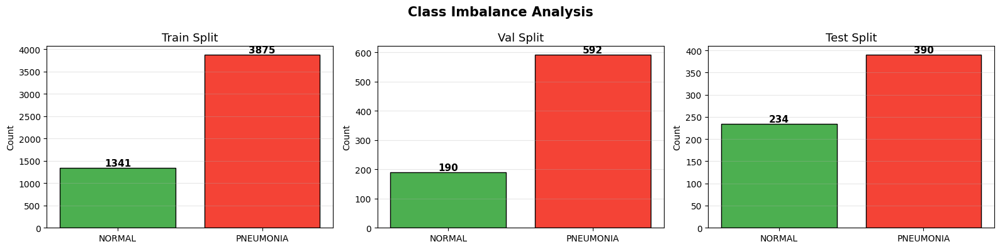

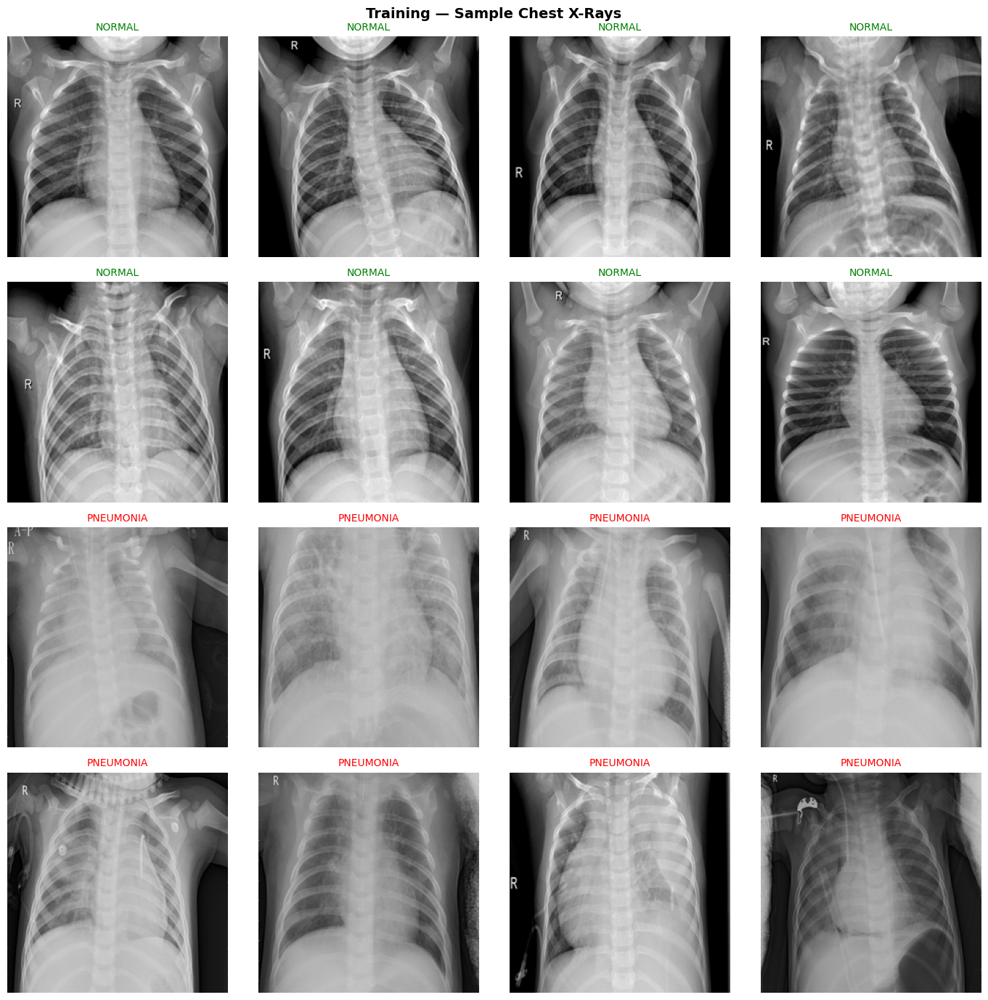


  RAM after data prep: 2633 MB


In [4]:
# Run Sections 0 through 12, plus the new Section 13 above, then run:

(train_ds, train_steps,
 x_val, y_val_oh, y_val,
 x_test, y_test_oh, y_test,
 class_weights) = prepare_data(CFG)


 🚀 STARTING PIPELINE FOR: EfficientNetB0
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → EfficientNetB0
  RAM before fit: 2633 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 70s 174ms/step - accuracy: 0.8766 - loss: 0.3895 - val_accuracy: 0.8760 - val_loss: 0.3922 - learning_rate: 5.0000e-05
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 38s 136ms/step - accuracy: 0.9369 - loss: 0.2667 - val_accuracy: 0.9412 - val_loss: 0.2677 - learning_rate: 5.0000e-05
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - accuracy: 0.9420 - loss: 0.2413 - val_accuracy: 0.9054 - val_loss: 0.3337 - learning_rate: 5.0000e-05
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - accuracy: 0.9504 - loss: 0.2269 - val_accuracy: 0.9616 - val_loss: 0.1992 - learning_rate: 5.0000e-05
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - accuracy: 0.9605 - loss: 0.2138 - val_accuracy: 0.8772 - val_loss: 0.4507 - learning_rate: 5.0000e-05
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - 

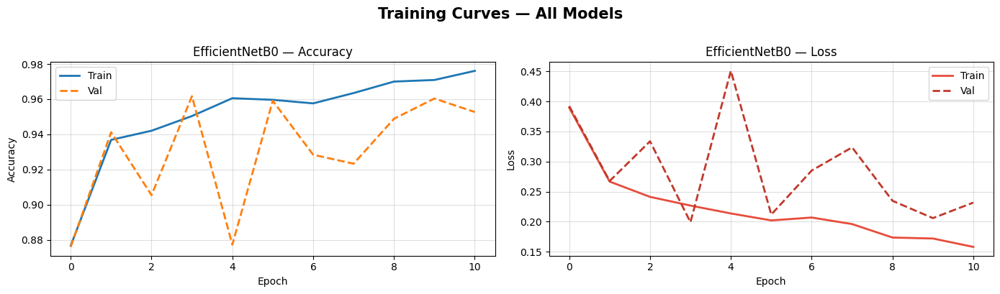


── Evaluating EfficientNetB0 ──────────────────────────
  Test  → loss=0.4916  acc=0.8702
  Val   → loss=0.1992   acc=0.9616
  Precision=0.8411  Recall=0.9769  Specificity=0.6923  F1=0.9039  AUC=0.9612

              precision    recall  f1-score   support

      NORMAL       0.95      0.69      0.80       234
   PNEUMONIA       0.84      0.98      0.90       390

    accuracy                           0.87       624
   macro avg       0.89      0.83      0.85       624
weighted avg       0.88      0.87      0.86       624



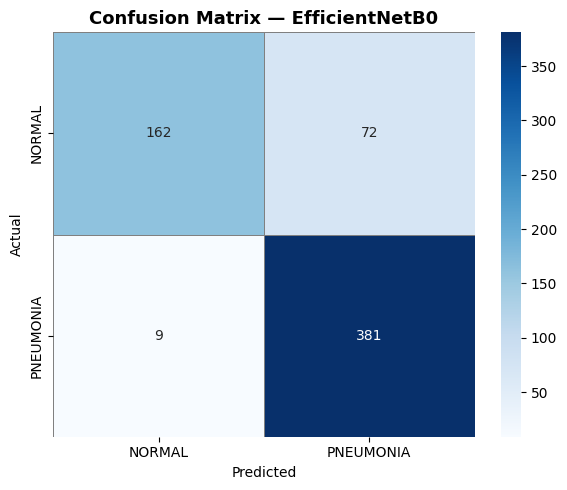

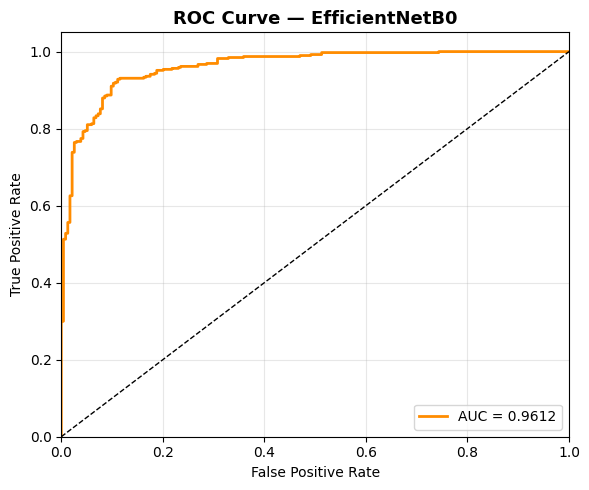

 ✅ EfficientNetB0 complete! All artifacts saved to disk.
  🧹 [After EfficientNetB0] GPU mem in use: 0.04 GB
  ✅ Loaded EfficientNetB0 from /content/pneumonia_output/models/EfficientNetB0.keras

── Grad-CAM → EfficientNetB0 ──────────────────────────
  Target conv layer: top_conv


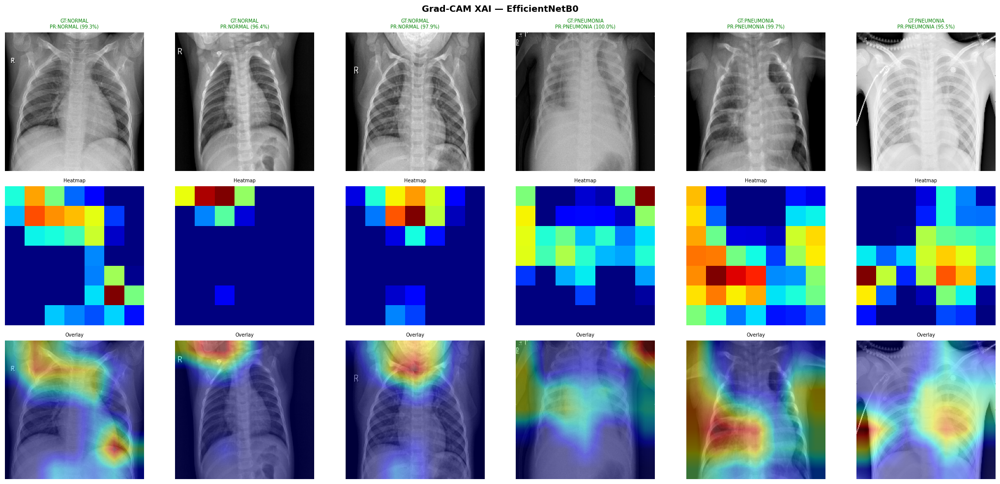

  🧹 [After Grad-CAM EfficientNetB0] GPU mem in use: 0.06 GB


In [5]:
run_single_model("EfficientNetB0", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("EfficientNetB0", CFG["SAVE_DIR"])
run_gradcam_on_all({"EfficientNetB0": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM EfficientNetB0")


 🚀 STARTING PIPELINE FOR: DenseNet121
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → DenseNet121
  RAM before fit: 3041 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 69s 183ms/step - accuracy: 0.8834 - loss: 0.3747 - val_accuracy: 0.9437 - val_loss: 0.2516 - learning_rate: 1.0000e-04
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - accuracy: 0.9362 - loss: 0.2557 - val_accuracy: 0.9079 - val_loss: 0.3832 - learning_rate: 1.0000e-04
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - accuracy: 0.9538 - loss: 0.2134 - val_accuracy: 0.9220 - val_loss: 0.2988 - learning_rate: 1.0000e-04
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - accuracy: 0.9590 - loss: 0.1957 - val_accuracy: 0.9552 - val_loss: 0.2108 - learning_rate: 1.0000e-04
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - accuracy: 0.9630 - loss: 0.1837 - val_accuracy: 0.9719 - val_loss: 0.1555 - learning_rate: 1.0000e-04
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - accura

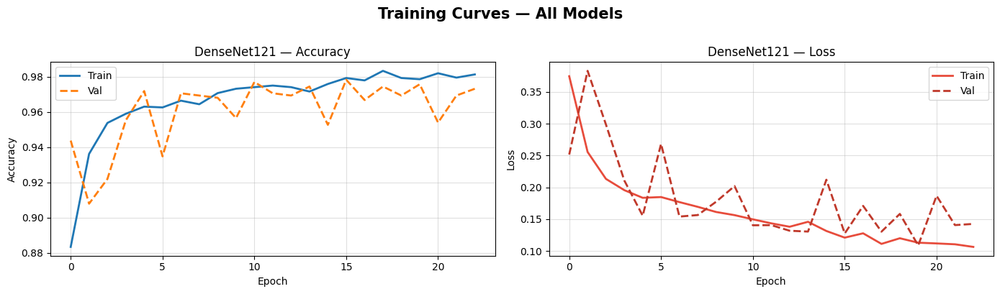


── Evaluating DenseNet121 ──────────────────────────
  Test  → loss=0.5975  acc=0.8686
  Val   → loss=0.1276   acc=0.9783
  Precision=0.8291  Recall=0.9949  Specificity=0.6581  F1=0.9044  AUC=0.9730

              precision    recall  f1-score   support

      NORMAL       0.99      0.66      0.79       234
   PNEUMONIA       0.83      0.99      0.90       390

    accuracy                           0.87       624
   macro avg       0.91      0.83      0.85       624
weighted avg       0.89      0.87      0.86       624



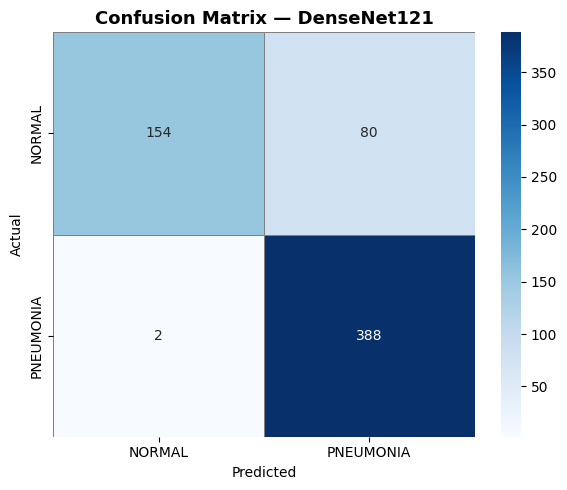

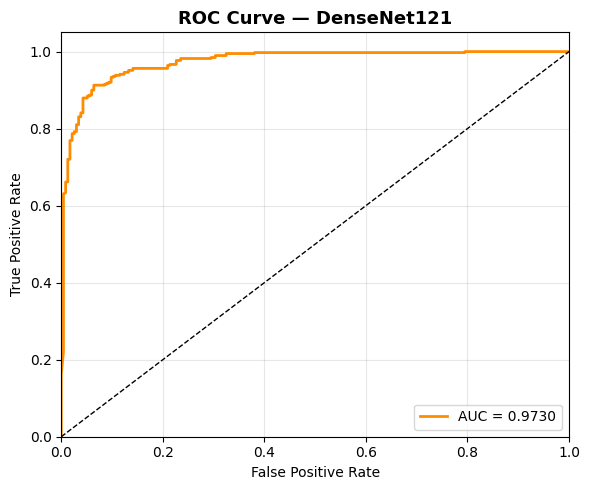

 ✅ DenseNet121 complete! All artifacts saved to disk.
  🧹 [After DenseNet121] GPU mem in use: 0.12 GB
  ✅ Loaded DenseNet121 from /content/pneumonia_output/models/DenseNet121.keras

── Grad-CAM → DenseNet121 ──────────────────────────
  Target conv layer: conv5_block16_2_conv


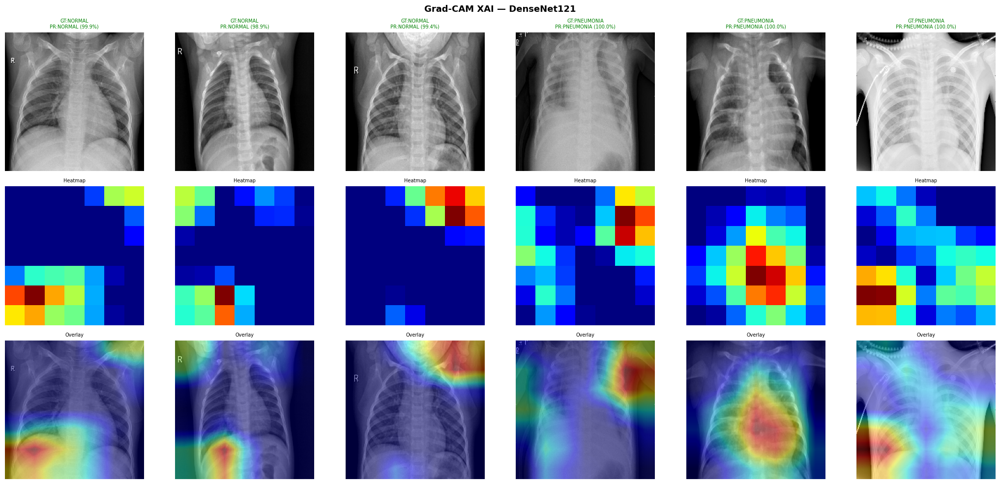

  🧹 [After Grad-CAM DenseNet121] GPU mem in use: 0.12 GB


In [6]:
run_single_model("DenseNet121", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("DenseNet121", CFG["SAVE_DIR"])
run_gradcam_on_all({"DenseNet121": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM DenseNet121")


 🚀 STARTING PIPELINE FOR: MobileNetV2
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → MobileNetV2
  RAM before fit: 3546 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 46s 133ms/step - accuracy: 0.8929 - loss: 0.3598 - val_accuracy: 0.9246 - val_loss: 0.3217 - learning_rate: 1.0000e-04
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - accuracy: 0.9425 - loss: 0.2547 - val_accuracy: 0.9182 - val_loss: 0.2850 - learning_rate: 1.0000e-04
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 33s 117ms/step - accuracy: 0.9601 - loss: 0.2105 - val_accuracy: 0.8683 - val_loss: 0.5488 - learning_rate: 1.0000e-04
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - accuracy: 0.9630 - loss: 0.2053 - val_accuracy: 0.9514 - val_loss: 0.2482 - learning_rate: 1.0000e-04
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 34s 121ms/step - accuracy: 0.9684 - loss: 0.1826 - val_accuracy: 0.9744 - val_loss: 0.1675 - learning_rate: 1.0000e-04
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - accuracy

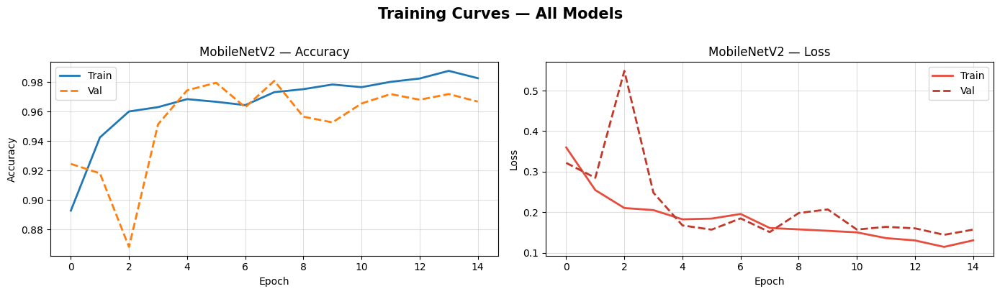


── Evaluating MobileNetV2 ──────────────────────────
  Test  → loss=0.7233  acc=0.8285
  Val   → loss=0.1511   acc=0.9808
  Precision=0.7859  Recall=0.9974  Specificity=0.5470  F1=0.8791  AUC=0.9759

              precision    recall  f1-score   support

      NORMAL       0.99      0.55      0.71       234
   PNEUMONIA       0.79      1.00      0.88       390

    accuracy                           0.83       624
   macro avg       0.89      0.77      0.79       624
weighted avg       0.86      0.83      0.81       624



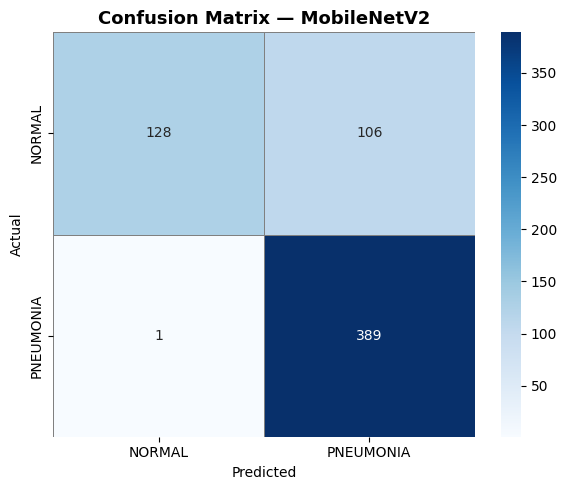

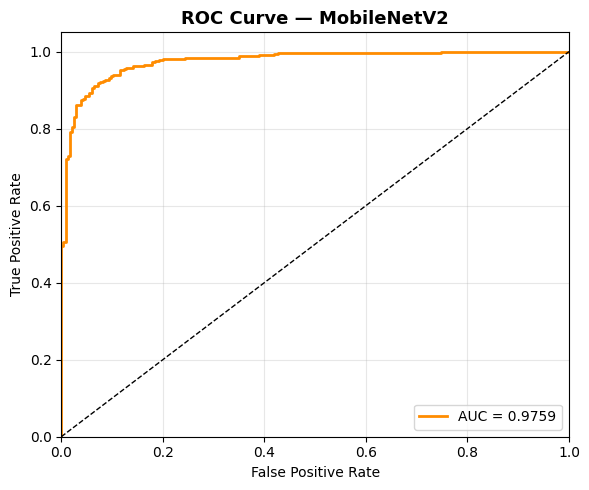

 ✅ MobileNetV2 complete! All artifacts saved to disk.
  🧹 [After MobileNetV2] GPU mem in use: 0.15 GB
  ✅ Loaded MobileNetV2 from /content/pneumonia_output/models/MobileNetV2.keras

── Grad-CAM → MobileNetV2 ──────────────────────────
  Target conv layer: Conv_1


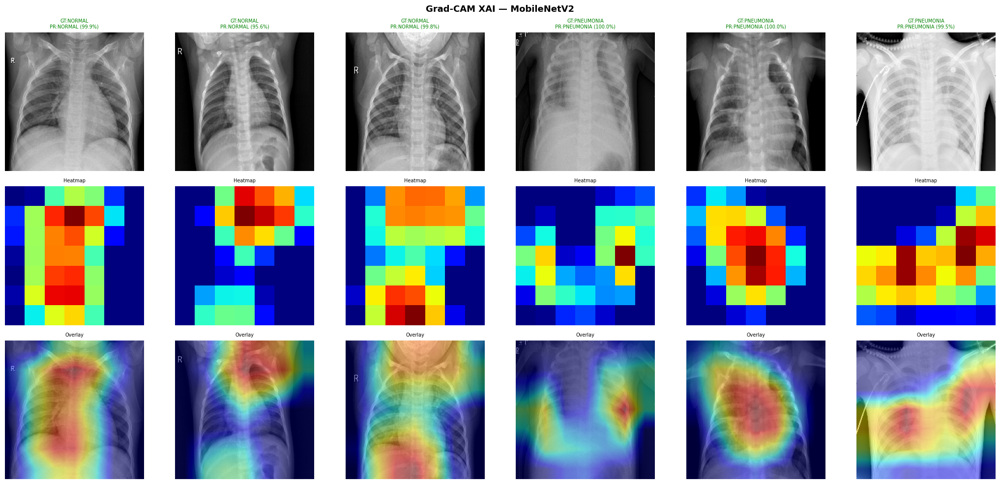

  🧹 [After Grad-CAM MobileNetV2] GPU mem in use: 0.15 GB


In [7]:
run_single_model("MobileNetV2", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("MobileNetV2", CFG["SAVE_DIR"])
run_gradcam_on_all({"MobileNetV2": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM MobileNetV2")


 🚀 STARTING PIPELINE FOR: ResNet50
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → ResNet50
  RAM before fit: 3629 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - accuracy: 0.9073 - loss: 0.3589 - val_accuracy: 0.9463 - val_loss: 0.2710 - learning_rate: 1.0000e-04
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - accuracy: 0.9553 - loss: 0.2394 - val_accuracy: 0.9578 - val_loss: 0.2229 - learning_rate: 1.0000e-04
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - accuracy: 0.9614 - loss: 0.2073 - val_accuracy: 0.9680 - val_loss: 0.1770 - learning_rate: 1.0000e-04
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 38s 137ms/step - accuracy: 0.9526 - loss: 0.2300 - val_accuracy: 0.8939 - val_loss: 0.3954 - learning_rate: 1.0000e-04
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - accuracy: 0.9700 - loss: 0.1862 - val_accuracy: 0.8939 - val_loss: 0.4585 - learning_rate: 1.0000e-04
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - accuracy: 0.

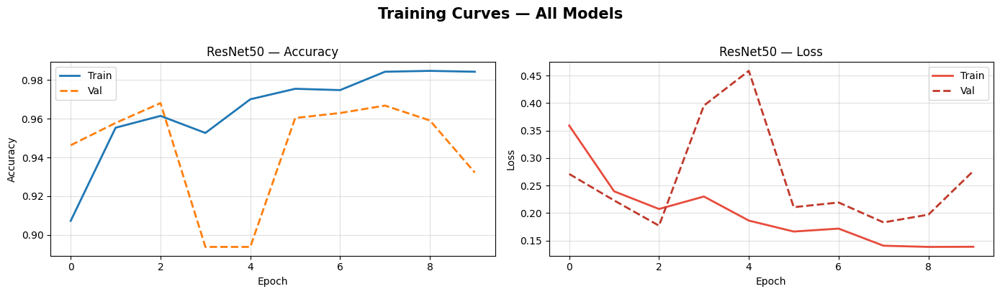


── Evaluating ResNet50 ──────────────────────────
  Test  → loss=0.7560  acc=0.8269
  Val   → loss=0.1770   acc=0.9680
  Precision=0.7854  Recall=0.9949  Specificity=0.5470  F1=0.8778  AUC=0.9644

              precision    recall  f1-score   support

      NORMAL       0.98      0.55      0.70       234
   PNEUMONIA       0.79      0.99      0.88       390

    accuracy                           0.83       624
   macro avg       0.89      0.77      0.79       624
weighted avg       0.86      0.83      0.81       624



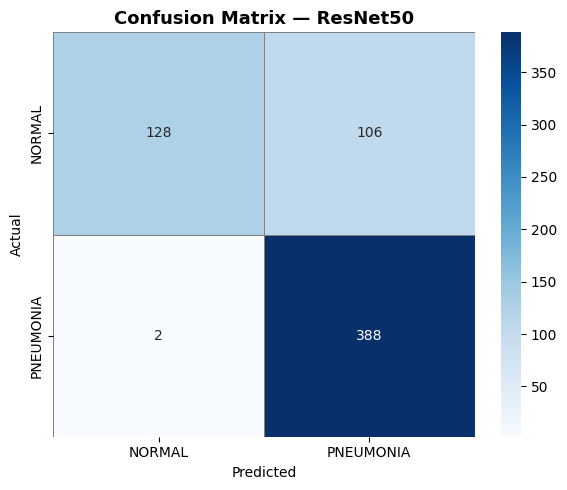

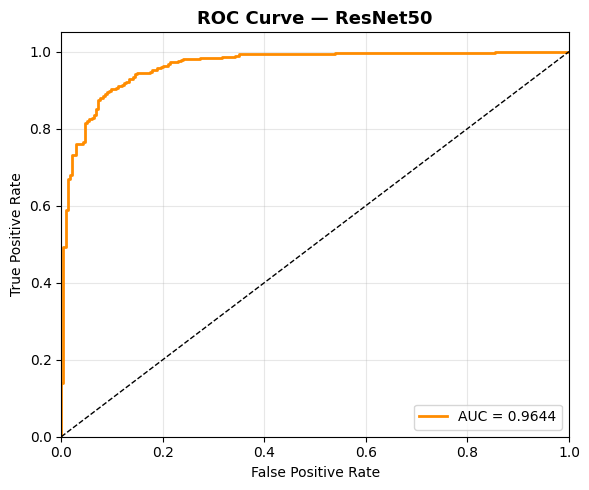

 ✅ ResNet50 complete! All artifacts saved to disk.
  🧹 [After ResNet50] GPU mem in use: 0.41 GB
  ✅ Loaded ResNet50 from /content/pneumonia_output/models/ResNet50.keras

── Grad-CAM → ResNet50 ──────────────────────────
  Target conv layer: conv5_block3_3_conv


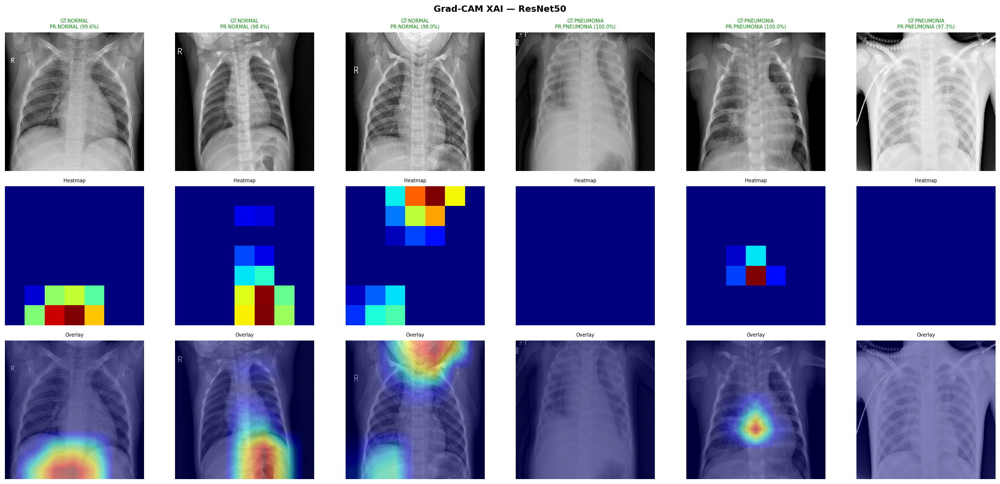

  🧹 [After Grad-CAM ResNet50] GPU mem in use: 0.41 GB


In [8]:
run_single_model("ResNet50", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("ResNet50", CFG["SAVE_DIR"])
run_gradcam_on_all({"ResNet50": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM ResNet50")


 🚀 STARTING PIPELINE FOR: InceptionV3
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → InceptionV3
  RAM before fit: 4042 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - accuracy: 0.8701 - loss: 0.4358 - val_accuracy: 0.9373 - val_loss: 0.2730 - learning_rate: 1.0000e-04
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - accuracy: 0.9335 - loss: 0.3061 - val_accuracy: 0.8862 - val_loss: 0.4228 - learning_rate: 1.0000e-04
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - accuracy: 0.9402 - loss: 0.2730 - val_accuracy: 0.9373 - val_loss: 0.2780 - learning_rate: 1.0000e-04
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - accuracy: 0.9493 - loss: 0.2600 - val_accuracy: 0.9092 - val_loss: 0.3386 - learning_rate: 1.0000e-04
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - accuracy: 0.9526 - loss: 0.2335 - val_accuracy: 0.9322 - val_loss: 0.2657 - learning_rate: 1.0000e-04
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accura

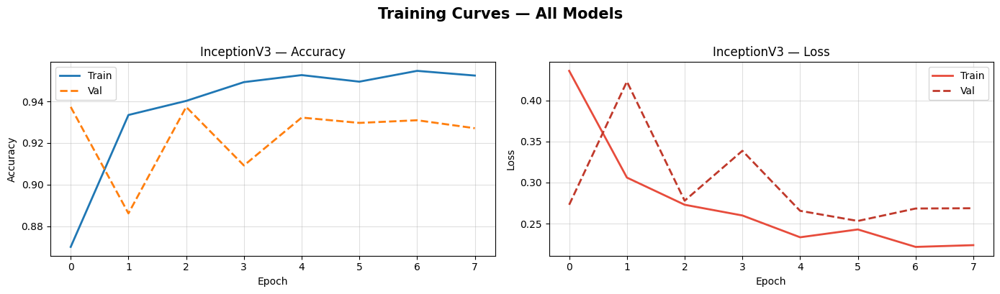


── Evaluating InceptionV3 ──────────────────────────
  Test  → loss=0.6725  acc=0.7997
  Val   → loss=0.2730   acc=0.9373
  Precision=0.7743  Recall=0.9590  Specificity=0.5342  F1=0.8568  AUC=0.9285

              precision    recall  f1-score   support

      NORMAL       0.89      0.53      0.67       234
   PNEUMONIA       0.77      0.96      0.86       390

    accuracy                           0.80       624
   macro avg       0.83      0.75      0.76       624
weighted avg       0.82      0.80      0.79       624



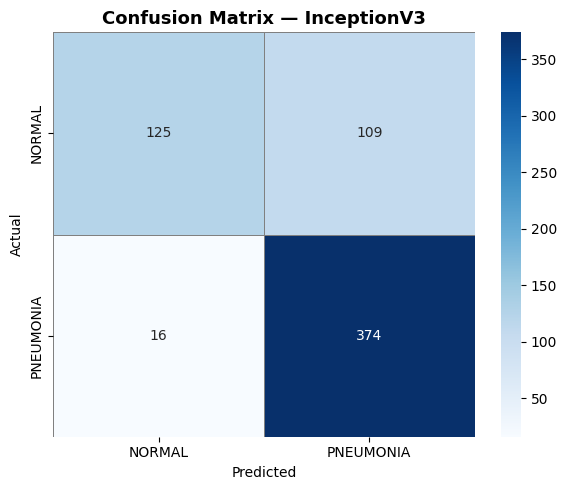

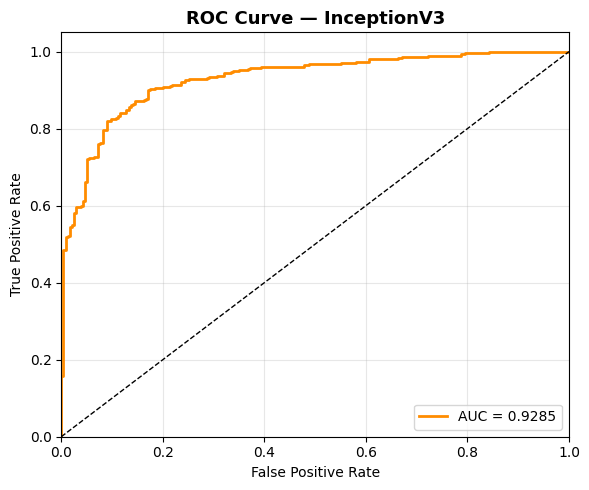

 ✅ InceptionV3 complete! All artifacts saved to disk.
  🧹 [After InceptionV3] GPU mem in use: 0.58 GB
  ✅ Loaded InceptionV3 from /content/pneumonia_output/models/InceptionV3.keras

── Grad-CAM → InceptionV3 ──────────────────────────
  Target conv layer: conv2d_93


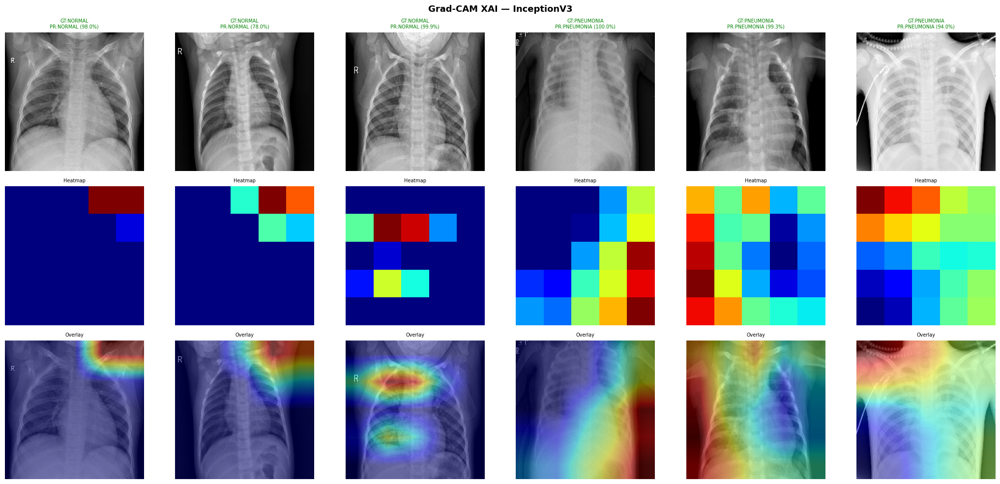

  🧹 [After Grad-CAM InceptionV3] GPU mem in use: 0.58 GB


In [9]:
run_single_model("InceptionV3", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("InceptionV3", CFG["SAVE_DIR"])
run_gradcam_on_all({"InceptionV3": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM InceptionV3")


 🚀 STARTING PIPELINE FOR: VGG16
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

  Training → VGG16
  RAM before fit: 4179 MB
Epoch 1/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - accuracy: 0.8622 - loss: 0.4022 - val_accuracy: 0.9092 - val_loss: 0.3429 - learning_rate: 1.0000e-04
Epoch 2/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - accuracy: 0.9359 - loss: 0.2402 - val_accuracy: 0.9514 - val_loss: 0.1919 - learning_rate: 1.0000e-04
Epoch 3/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - accuracy: 0.9558 - loss: 0.2047 - val_accuracy: 0.8875 - val_loss: 0.3550 - learning_rate: 1.0000e-04
Epoch 4/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - accuracy: 0.9549 - loss: 0.1994 - val_accuracy: 0.9284 - val_loss: 0.2421 - learning_rate: 1.0000e-04
Epoch 5/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - accuracy: 0.9612 - loss: 0.1793 - val_accuracy: 0.9834 - val_loss: 0.1714 - learning_rate: 1.0000e-04
Epoch 6/30
278/278 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - accuracy: 0.9621 -

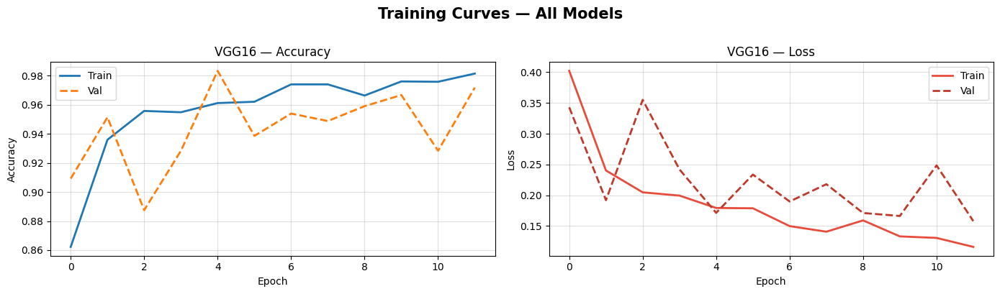


── Evaluating VGG16 ──────────────────────────
  Test  → loss=0.6064  acc=0.8077
  Val   → loss=0.1714   acc=0.9834
  Precision=0.7657  Recall=0.9974  Specificity=0.4915  F1=0.8664  AUC=0.9606

              precision    recall  f1-score   support

      NORMAL       0.99      0.49      0.66       234
   PNEUMONIA       0.77      1.00      0.87       390

    accuracy                           0.81       624
   macro avg       0.88      0.74      0.76       624
weighted avg       0.85      0.81      0.79       624



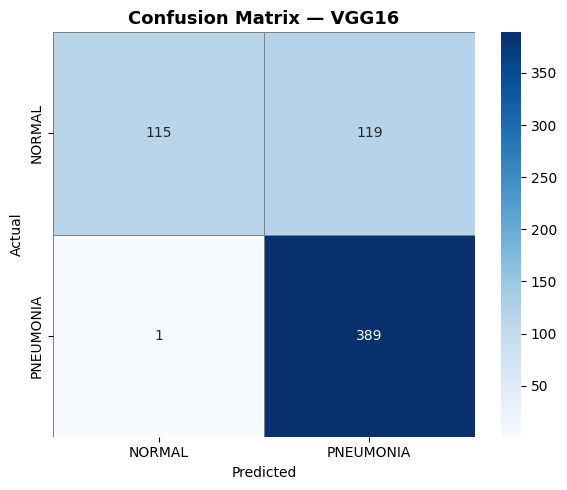

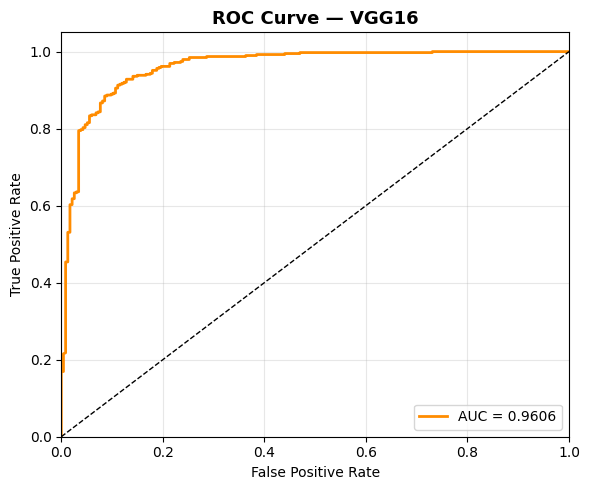

 ✅ VGG16 complete! All artifacts saved to disk.
  🧹 [After VGG16] GPU mem in use: 0.75 GB
  ✅ Loaded VGG16 from /content/pneumonia_output/models/VGG16.keras

── Grad-CAM → VGG16 ──────────────────────────
  Target conv layer: block5_conv3


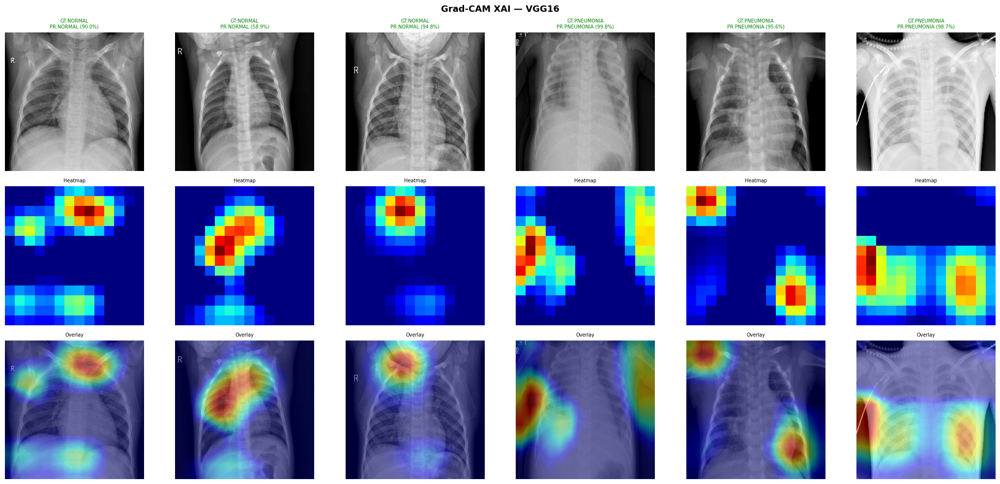

  🧹 [After Grad-CAM VGG16] GPU mem in use: 0.75 GB


In [10]:
run_single_model("VGG16", train_ds, train_steps, x_val, y_val_oh, y_val, x_test, y_test_oh, y_test, class_weights, CFG)

# Apply Grad-CAM via the loaded model from disk
loaded_model = load_model_keras("VGG16", CFG["SAVE_DIR"])
run_gradcam_on_all({"VGG16": loaded_model}, x_val, y_val, CFG["CLASS_NAMES"], CFG["PLOTS_DIR"], n_samples=6)
del loaded_model
free_memory("After Grad-CAM VGG16")


 📊 AGGREGATING FINAL RESULTS
  📥 Loaded metrics for InceptionV3
  📥 Loaded metrics for ResNet50
  📥 Loaded metrics for VGG16
  📥 Loaded metrics for EfficientNetB0
  📥 Loaded metrics for DenseNet121
  📥 Loaded metrics for MobileNetV2


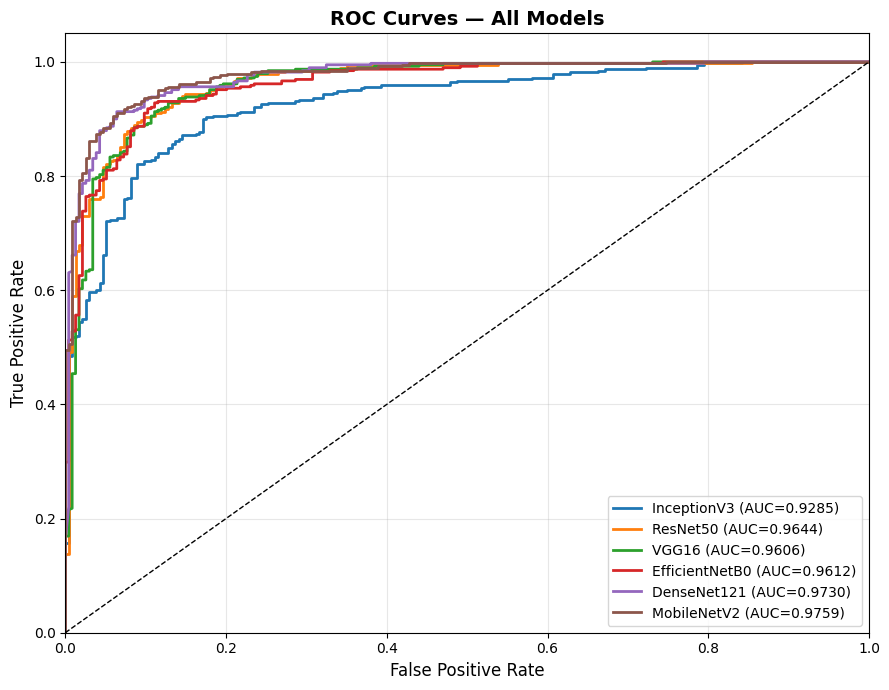


  MODEL COMPARISON TABLE
 Rank          Model  Test Acc  Val Acc  Precision  Recall  Specificity  F1 Score  AUC-ROC  Test Loss  Val Loss  TP  TN  FP  FN
    1    DenseNet121    0.8686   0.9783     0.8291  0.9949       0.6581    0.9044   0.9730     0.5975    0.1276 388 154  80   2
    2 EfficientNetB0    0.8702   0.9616     0.8411  0.9769       0.6923    0.9039   0.9612     0.4916    0.1992 381 162  72   9
    3    MobileNetV2    0.8285   0.9808     0.7859  0.9974       0.5470    0.8791   0.9759     0.7233    0.1511 389 128 106   1
    4       ResNet50    0.8269   0.9680     0.7854  0.9949       0.5470    0.8778   0.9644     0.7560    0.1770 388 128 106   2
    5          VGG16    0.8077   0.9834     0.7657  0.9974       0.4915    0.8664   0.9606     0.6064    0.1714 389 115 119   1
    6    InceptionV3    0.7997   0.9373     0.7743  0.9590       0.5342    0.8568   0.9285     0.6725    0.2730 374 125 109  16

  📊 Comparison CSV → /content/pneumonia_output/metrics/model_comparison.csv


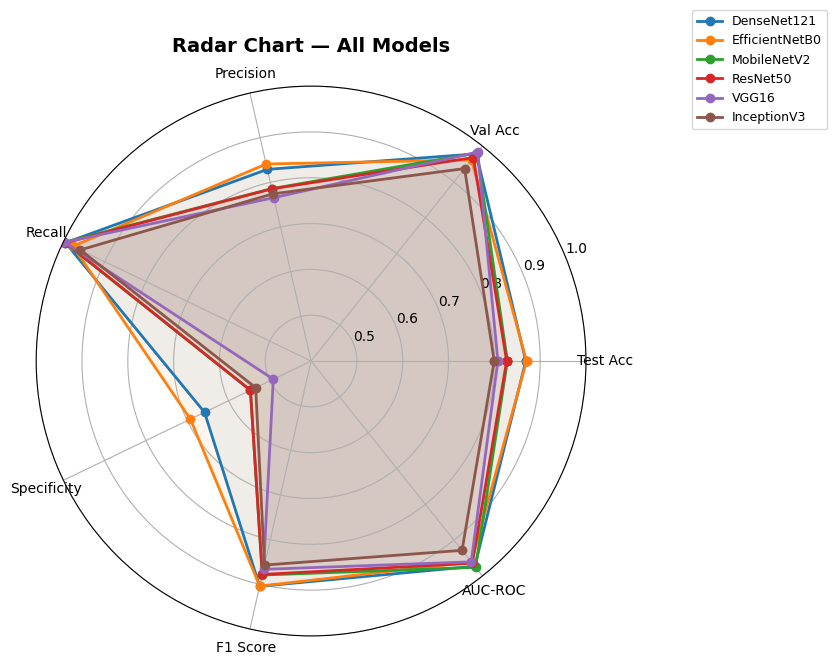

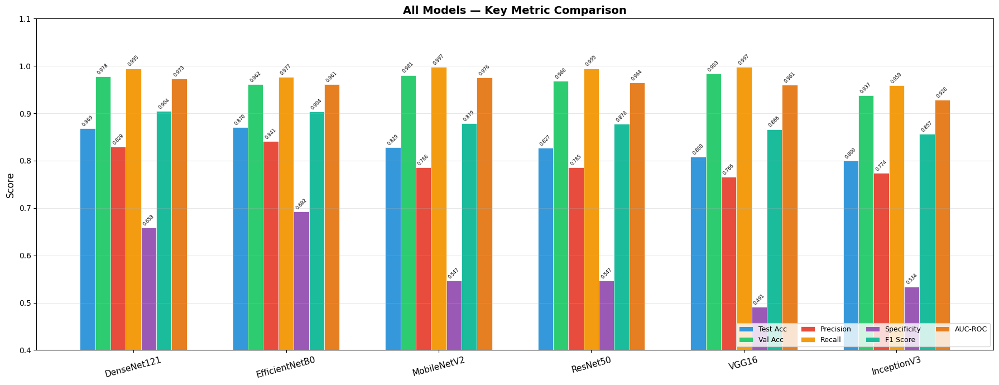

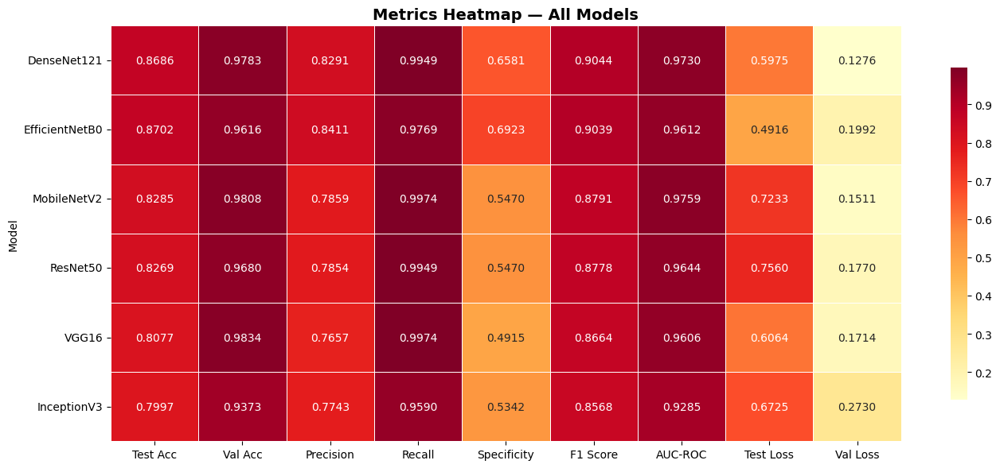


🏆 BEST MODEL : DenseNet121
  💾 Best model copied to: /content/pneumonia_output/best/DenseNet121.keras

  📁  SAVED FILES SUMMARY
  Root: /content/pneumonia_output
  📂 pneumonia_output/
      📂 best/
          🧠 DenseNet121.keras  (42.08 MB)
      📂 histories/
          💾 DenseNet121_history.pkl  (0.00 MB)
          💾 EfficientNetB0_history.pkl  (0.00 MB)
          💾 InceptionV3_history.pkl  (0.00 MB)
          💾 MobileNetV2_history.pkl  (0.00 MB)
          💾 ResNet50_history.pkl  (0.00 MB)
          💾 VGG16_history.pkl  (0.00 MB)
      📂 metrics/
          📊 DenseNet121_epoch_log.csv  (0.00 MB)
          📄 DenseNet121_metrics.json  (0.00 MB)
          💾 DenseNet121_predictions.pkl  (0.00 MB)
          📊 EfficientNetB0_epoch_log.csv  (0.00 MB)
          📄 EfficientNetB0_metrics.json  (0.00 MB)
          💾 EfficientNetB0_predictions.pkl  (0.00 MB)
          📊 InceptionV3_epoch_log.csv  (0.00 MB)
          📄 InceptionV3_metrics.json  (0.00 MB)
          💾 InceptionV3_predictions.pkl  (0.0

In [11]:
aggregate_final_results(CFG, y_test)

In [13]:
import os
import shutil
import time

# 2. Configure Paths
source_dir = '/content/pneumonia_output'
local_zip = '/content/pneumonia_output'  # shutil.make_archive appends '.zip' automatically
drive_dest_dir = '/content/drive/MyDrive/pneumonia_results'
drive_zip_path = os.path.join(drive_dest_dir, 'pneumonia_output.zip')

# Check if the source directory exists before proceeding
if not os.path.exists(source_dir):
    print(f"Error: The source folder '{source_dir}' does not exist. Ensure your training run completed.")
else:
    # Create the destination directory in your Google Drive if it does not exist
    os.makedirs(drive_dest_dir, exist_ok=True)

    # 3. Zip the output folder locally
    print(f"Zipping '{source_dir}' locally (this may take a minute due to the 1.6 GB size)...")
    start_time = time.time()
    local_zip_file = shutil.make_archive(local_zip, 'zip', source_dir)
    zip_size_gb = os.path.getsize(local_zip_file) / (1024**3)
    print(f"Local zip created: {local_zip_file} ({zip_size_gb:.2f} GB) in {time.time() - start_time:.2f} seconds.")

    # 4. Copy the zip file from Colab local SSD to your Google Drive
    print(f"Transferring zip file to Google Drive: '{drive_zip_path}'...")
    start_time = time.time()
    shutil.copy(local_zip_file, drive_zip_path)
    print(f"Transfer completed in {time.time() - start_time:.2f} seconds.")

    # 5. Clean up the local temporary zip file to free space on Colab disk
    if os.path.exists(local_zip_file):
        os.remove(local_zip_file)
        print("Cleaned up local zip file to free disk space.")

    print("Process complete. Your output folder has been backed up to Google Drive.")


Zipping '/content/pneumonia_output' locally (this may take a minute due to the 1.6 GB size)...
Local zip created: /content/pneumonia_output.zip (1.48 GB) in 93.73 seconds.
Transferring zip file to Google Drive: '/content/drive/MyDrive/pneumonia_results/pneumonia_output.zip'...
Transfer completed in 18.19 seconds.
Cleaned up local zip file to free disk space.
Process complete. Your output folder has been backed up to Google Drive.
